In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (100,50)
#import seaborn as sns

from pathlib import Path
from skimage.util import dtype
from skimage import img_as_ubyte

import numpy as np
import pandas as pd

from imutils import resize

from skimage import img_as_float, io
from skimage.io import imread, imshow, imsave
from skimage.color import rgb2gray

from skimage.exposure import adjust_log, adjust_gamma, adjust_sigmoid, rescale_intensity, equalize_hist, equalize_adapthist

from skimage.restoration import denoise_nl_means, denoise_wavelet, estimate_sigma, denoise_tv_bregman, denoise_tv_chambolle
#from skimage.metrics import peak_signal_noise_ratio

from skimage.filters import apply_hysteresis_threshold, try_all_threshold, threshold_local, threshold_isodata
from skimage import img_as_float32

In [2]:
def get_coordinates(img: np.ndarray) -> ([int], [int], int, int):
    """Считает координаты для разрезов, по Х, У и высоту, ширину
    :param img: изображение
    :return: 2 массива с координатами по Х, У и высоту, ширину.
    """
    # Получение высоты и ширины изображения
    (h, w) = img.shape[:2]

    # Заполнение массивов координат X для вертикальных и
    # Y для горизонтальных линий
    x = [0, 0.96 / 15 * w + 1, 1.96 / 15 * w, 2.96 / 15 * w, 3.96 / 15 * w,
         4.96 / 15 * w, 5.96 / 15 * w, 6.98 / 15 * w, 7.98 / 15 * w, 9 / 15 * w,
         10 / 15 * w, 11.01 / 15 * w, 12.01 / 15 * w, 13.03 / 15 * w,
         14.04 / 15 * w, 14.99 / 15 * w]
    x = [round(x[m]) for m in range(16)]
    y = [round(h / 15 * n) for n in range(16)]

    return x, y, h, w


# authors - Pavel, Mikhail and Sergei
def cut_by_external_contour(img: np.ndarray) -> np.ndarray:
    """
    Обрезает внешний контур объекта на изображении
    Подходит для игральной доски
    :param img: Изображение на вход
    :return: Обрезанное изображение
    """

    try:
        ratio = img.shape[0] / 750.0
        orig = img.copy()
        img = resize(img, height=750)

        # Черно-белое изображение
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Размытие по Гауссу, оптимальные параметры: (5, 5)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # Изображение с границами
        edged = cv2.Canny(gray, 75, 150)

        # Получение некого параметра для морфологического преобразования
        # Оптимальные параметры: (7, 7)
        # Затем само морфологическое преобразование (закрытие контуров)
        kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7, 7))
        edged = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)

        # Массив всех контуров
        contours = cv2.findContours(edged.copy(), cv2.RETR_LIST,
                                    cv2.CHAIN_APPROX_SIMPLE)
        contours = grab_contours(contours)

        # Сортировка контуров по убыванию площади
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

        screen_cnt = None  # самый большой контур с 4 точками
        # идем по циклу контуров от самого большого до
        # самого маленького (они уже отсортированы)
        for c in contours:
            peri = cv2.arcLength(c, True)  # периметр контура

            # аппроксимация: если точки слишком рядом - сливаем их в одну
            # это позволяет выдержать небольшую погрешность на изображении
            # оптимальный параметр от 0.02 * периметр до 0.06 * периметр
            approx = cv2.approxPolyDP(c, 0.04 * peri, True)

            # берем самый большой контур с 4 точками
            if len(approx) == 4:
                screen_cnt = approx
                break
                # меняем перспективу на вид сверху
        cropped = four_point_transform(orig, screen_cnt.reshape(4, 2) * ratio)

    except AttributeError:
        raise CutException

    return cropped


# author - Mikhail, Pavel
def cut_by_internal_contour(img: np.ndarray,
                            left=3.95, top=4.0,
                            right=1.5, bot=1.2) -> np.ndarray:
    """
    Обрезает изображение с разных сторон
    :param img: Изображение на вход
    :param left: Сколько процентов обрезать слева
    :param top: Сколько процентов обрезать сверху
    :param right: Сколько процентов обрезать справа
    :param bot: Сколько процентов обрезать снизу
    :return: Обрезанное изображение
    """

    try:
        (h, w) = img.shape[:2]  # получение размеров игровой доски
        # обрезка
        cropped = img[round(top * w / 100):round(h * (1 - bot / 100)),
                  round(left * h / 100):round(w * (1 - right / 100))]

        (h, w) = cropped.shape[:2]  # получение размеров игрового поля

        allowable_error = 0.03  # погрешность при проверке на квадратность
        # если cropped не квадрат (допускается погрешность)

        # границы отношения ширины к высоте в пределах заданной погрешности
        top_line = 1 * (1 + allowable_error)  # верхняя граница
        bot_line = 1 / (1 + allowable_error)  # нижняя граница
        # if not (bot_line <= w / h <= top_line):
        #     raise CutException('Not a square')

    except AttributeError:
        raise

    return cropped


# author - Mikhail
def draw_the_grid(img: np.ndarray) -> np.ndarray:
    """
    Рисует сетку, по которой можно производить разбивку на 15x15 ячеек
    :param img: Изображение на вход
    :return: Изображение с сеткой
    """

    # Получение координат, высоты и ширины изображения
    x, y, h, w = get_coordinates(img)

    # Вертикальные линии
    for n in x:
        start_point = (n, 0)
        end_point = (n, h)
        cv2.line(img, start_point, end_point, color=(0, 255, 0), thickness=2)
    # Горизонтальные линии
    for n in y:
        start_point = (0, n)
        end_point = (w, n)
        cv2.line(img, start_point, end_point, color=(0, 255, 0), thickness=2)

    return img


# author - Mikhail
def cut_board_on_cells(img: np.ndarray) -> [np.ndarray]:
    """
    Делит изображение на квадраты-ячейки, создавая двухмерный массив из них
    :param img: Изображение на вход
    :return: Массив ячеек длиной 15x15
    """

    # Получение координат, высоты и ширины изображения
    x, y, h, w = get_coordinates(img)

    # Заполнение массива
    squares = []
    for n in range(1, 16):
        squares.append([])
        for m in range(1, 16):
            cropped = img[y[n - 1]:y[n], x[m - 1]:x[m]]
            cropped = cv2.resize(cropped, (IMG_SIZE, IMG_SIZE))
            squares[n - 1].append(cropped)

    return np.array(squares)


# author - Sergei, Mikhail
def crop_letter(img_bin: np.ndarray) -> np.ndarray:
    """
    Вырезает из клетки букву
    :param img_bin: Пороговое изображение на вход
    :return: Пороговое обрезанное изображение
    """
    # Поиск контуров
    cropped = img_bin.copy()
    cropped = img_as_ubyte(cropped)
    # cropped = cv2.fastNlMeansDenoising(cropped)
    contours, _ = cv2.findContours(cropped, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_NONE)

    # Перебор контуров. Если периметр достаточно большой,
    # решаем, что это буква и обрезаем картинку по
    # её левому нижнему углу
    for idx, contour in enumerate(contours):
        (x, y, w, h) = cv2.boundingRect(contour)
        perimeter = cv2.arcLength(contour, True)
        square = w * h
        # cv2.rectangle(cropped, (x, y), (x + w, y + h), (255, 0, 0), 1)
        if square > 450:
            cropped = cropped[0:y + h, x:x + y + h]
            break

    cropped = cv2.resize(cropped, (IMG_SIZE, IMG_SIZE))
    #cropped = img_as_float32(cropped)

    return cropped

In [3]:
def rgb_to_gray(rgb: np.ndarray, coefficients: [float], force_copy=False) -> np.ndarray:
    """
    Т.к фишки на нашей доске синего цвета, результат будет лучше, если мы будем использовать
    не стандартные коэффициенты для перевода в оттенки серого, а те, которые будут подавлять
    синие оттенки.

    Это создаст более сильный контраст буквы. И мы сможем эффективнее
    использовать порогование.

    :param rgb: изображение в RGB формате. ИЗОБРАЖЕНИЕ НЕ ДОЛЖНО БЫТЬ ШУМНЫМ!
    :param coefficients: коэффициенты для в перевода в оттенки серого
    :param force_copy:
    :return: изображение в оттенках серого
    """

    # Проверяем форму массива, переводим в представление с плавающей точкой.
    rgb = np.asanyarray(rgb)
    if rgb.shape[-1] != 3:
        raise ValueError("Ожидается форма массива == (..., 3)), "
                         f"получено {rgb.shape}")

    rgb = dtype.img_as_float32(rgb, force_copy=force_copy)
    if len(coefficients) != 3:
        raise ValueError(f"Ожидается 3 коэффициента, получено {len(coefficients)}")
    coeffs = np.array(coefficients, dtype=rgb.dtype)

    return rgb @ coeffs


def gray_to_binary(image_gray: np.ndarray) -> np.ndarray:
    """
    Переводит изображение из оттенокв серого в черно-белое.
    :param image_gray: изображение в оттенках серого
    :return: изображение в ЧБ формате
    """
    img_denoised = denoise_tv_bregman(image_gray, weight=33)  # денойз
    # img_denoised = denoise_nl_means(image_gray)  # денойз
    img_adj = adjust_sigmoid(img_denoised, cutoff=0.4)  # Регулируем контраст (сигмовидная коррекция)

    # Находим порог для изображения и возвращаем изображение в ЧБ
    return np.array((img_adj > threshold_isodata(img_adj)), dtype=image_gray.dtype)
    # return img_adj


In [4]:
IMG_PATH_1 = Path.cwd().parent / Path('CV') / Path('test1.jpg')
IMG_PATH_2 = Path.cwd().parent / Path('CV') / Path('test2.jpg')
IMG_PATH_3 = Path.cwd().parent / Path('CV') / Path('test3.jpg')
IMG_PATH_4 = Path.cwd().parent / Path('CV') / Path('test4.jpg')
IMG_PATH_5 = Path.cwd().parent / Path('CV') / Path('test5.jpg')
IMG_PATH_6 = Path.cwd().parent / Path('CV') / Path('test6.jpg')
IMG_PATH_7 = Path.cwd().parent / Path('CV') / Path('test7.jpg')

In [6]:
img1 = img_as_float32(resize(imread(IMG_PATH_1), 1000))
img2 = img_as_float32(resize(imread(IMG_PATH_2), 1000))
img3 = img_as_float32(resize(imread(IMG_PATH_3), 1000))
img4 = img_as_float32(resize(imread(IMG_PATH_4), 1000))
img5 = img_as_float32(resize(imread(IMG_PATH_5), 1000))
img6 = img_as_float32(resize(imread(IMG_PATH_6), 1000))
img7 = img_as_float32(resize(imread(IMG_PATH_7), 1000))

In [7]:
img1

array([[[0.9450981 , 0.8745099 , 0.86666673],
        [0.95294124, 0.882353  , 0.8745099 ],
        [0.95294124, 0.8862746 , 0.882353  ],
        ...,
        [0.9960785 , 1.        , 0.9686275 ],
        [0.9960785 , 1.        , 0.9686275 ],
        [0.9960785 , 1.        , 0.9607844 ]],

       [[0.93725497, 0.86666673, 0.8588236 ],
        [0.93725497, 0.87843144, 0.86666673],
        [0.94117653, 0.882353  , 0.8705883 ],
        ...,
        [0.9960785 , 1.        , 0.9686275 ],
        [0.9960785 , 1.        , 0.9686275 ],
        [0.9960785 , 1.        , 0.9607844 ]],

       [[0.9294118 , 0.8705883 , 0.85098046],
        [0.9333334 , 0.8745099 , 0.854902  ],
        [0.93725497, 0.882353  , 0.86666673],
        ...,
        [0.9960785 , 1.        , 0.97647065],
        [0.9960785 , 1.        , 0.9725491 ],
        [0.9960785 , 1.        , 0.9686275 ]],

       ...,

       [[0.909804  , 0.86666673, 0.8313726 ],
        [0.909804  , 0.8588236 , 0.82745105],
        [0.909804  , 0

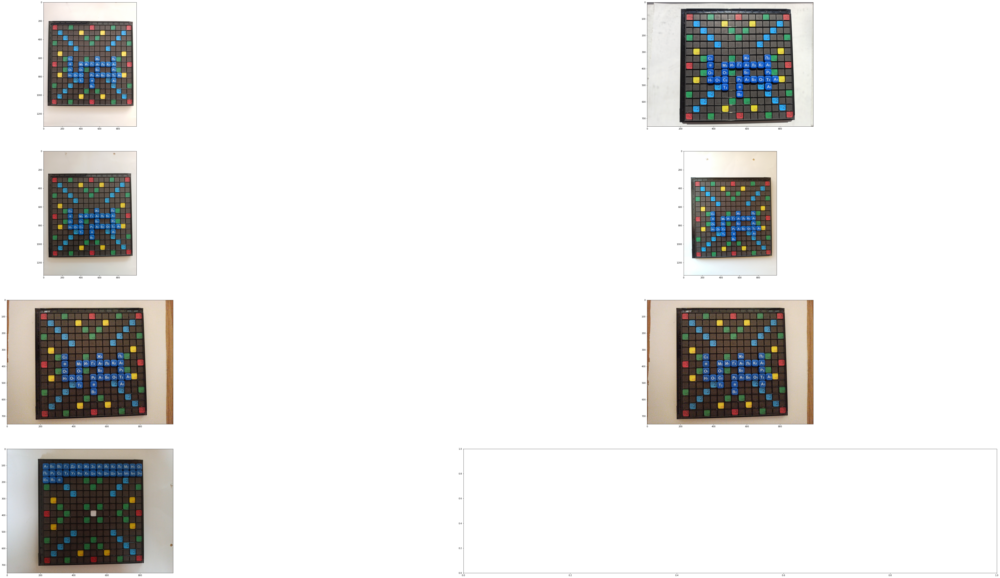

In [8]:
fig, ax = plt.subplots(nrows=4, ncols=2)

ax[0, 0].imshow(img1)
ax[1, 0].imshow(img2)
ax[1, 1].imshow(img3)
ax[0, 1].imshow(img4)
ax[2, 0].imshow(img5)
ax[2, 1].imshow(img6)
ax[3, 0].imshow(img7)

In [9]:
img1_gray = rgb_to_gray(img1, [1, 0, 0])
img2_gray = rgb_to_gray(img2, [1, 0, 0])
img3_gray = rgb_to_gray(img3, [1, 0, 0])
img4_gray = rgb_to_gray(img4, [1, 0, 0])
img5_gray = rgb_to_gray(img5, [1, 0, 0])
img6_gray = rgb_to_gray(img6, [1, 0, 0])
img7_gray = rgb_to_gray(img7, [1, 0, 0])

In [11]:
img1_gray

array([[0.9450981 , 0.95294124, 0.95294124, ..., 0.9960785 , 0.9960785 ,
        0.9960785 ],
       [0.93725497, 0.93725497, 0.94117653, ..., 0.9960785 , 0.9960785 ,
        0.9960785 ],
       [0.9294118 , 0.9333334 , 0.93725497, ..., 0.9960785 , 0.9960785 ,
        0.9960785 ],
       ...,
       [0.909804  , 0.909804  , 0.909804  , ..., 0.9960785 , 0.9960785 ,
        0.9921569 ],
       [0.909804  , 0.909804  , 0.91372555, ..., 0.9960785 , 1.        ,
        0.9960785 ],
       [0.9058824 , 0.9058824 , 0.91372555, ..., 1.        , 0.9960785 ,
        0.9960785 ]], dtype=float32)

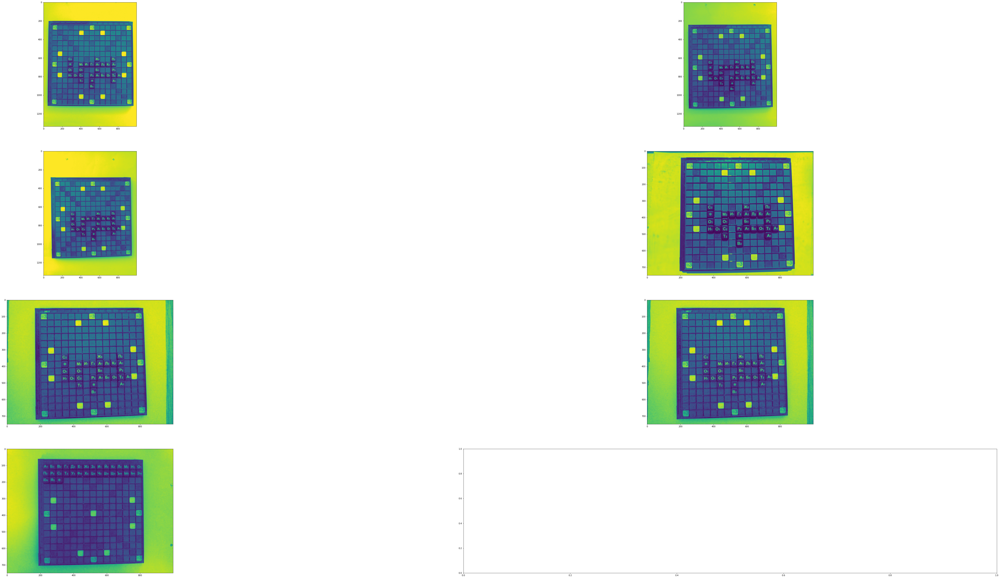

In [10]:
fig, ax = plt.subplots(nrows=4, ncols=2)

ax[0, 0].imshow(img1_gray)
ax[0, 1].imshow(img2_gray)
ax[1, 0].imshow(img3_gray)
ax[1, 1].imshow(img4_gray)
ax[2, 0].imshow(img5_gray)
ax[2, 1].imshow(img6_gray)
ax[3, 0].imshow(img7_gray)